In [2]:
import pandas as pd
import os
os.environ["OMP_NUM_THREADS"] = "3"

In [106]:
df=pd.read_csv("tripadvisor_review.csv").sample(frac=1).reset_index(drop=True)
df

,User ID,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
0,User 610,0.70,1.32,0.34,0.59,0.40,1.02,3.18,2.85,1.31,2.82
1,User 14,0.58,1.64,2.27,0.45,1.26,1.72,3.19,2.91,2.30,2.74
2,User 943,0.70,1.80,2.27,0.43,1.42,1.88,3.20,2.70,1.47,2.46
3,User 730,1.63,1.16,1.81,0.39,1.62,2.98,3.19,2.79,1.79,2.54
4,User 291,1.09,1.12,2.35,0.54,1.30,2.64,3.19,2.87,1.47,2.54
...,...,...,...,...,...,...,...,...,...,...,...
975,User 418,0.86,1.48,0.14,0.29,0.30,0.66,3.16,2.93,1.06,3.50
976,User 1,0.93,1.80,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
977,User 655,0.48,1.12,2.35,0.58,0.78,1.98,3.19,2.63,1.25,2.40
978,User 81,2.08,0.92,0.80,0.40,0.54,1.70,3.17,3.07,1.54,3.42


In [107]:
X=df[:735]
X

,User ID,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
0,User 610,0.70,1.32,0.34,0.59,0.40,1.02,3.18,2.85,1.31,2.82
1,User 14,0.58,1.64,2.27,0.45,1.26,1.72,3.19,2.91,2.30,2.74
2,User 943,0.70,1.80,2.27,0.43,1.42,1.88,3.20,2.70,1.47,2.46
3,User 730,1.63,1.16,1.81,0.39,1.62,2.98,3.19,2.79,1.79,2.54
4,User 291,1.09,1.12,2.35,0.54,1.30,2.64,3.19,2.87,1.47,2.54
...,...,...,...,...,...,...,...,...,...,...,...
730,User 361,0.58,1.48,0.19,0.56,0.16,1.26,3.18,2.82,1.66,2.70
731,User 3,1.22,0.80,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
732,User 944,0.64,1.68,0.24,0.47,0.94,1.66,3.18,2.77,1.57,3.04
733,User 647,0.94,0.80,0.35,0.56,0.48,1.78,3.18,2.86,2.18,2.66


In [108]:
df.isna().sum()
df.describe()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
count,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000
mean,0.893194,1.352612,1.013306,0.532500,0.939735,1.842898,3.180939,2.835061,1.569439,2.799224
std,0.326912,0.478280,0.788607,0.279731,0.437430,0.539538,0.007824,0.137505,0.364629,0.321380
min,0.340000,0.000000,0.130000,0.150000,0.060000,0.140000,3.160000,2.420000,0.740000,2.140000
25%,0.670000,1.080000,0.270000,0.410000,0.640000,1.460000,3.180000,2.740000,1.310000,2.540000
50%,0.830000,1.280000,0.820000,0.500000,0.900000,1.800000,3.180000,2.820000,1.540000,2.780000
75%,1.020000,1.560000,1.572500,0.580000,1.200000,2.200000,3.180000,2.910000,1.760000,3.040000
max,3.220000,3.640000,3.620000,3.440000,3.300000,3.760000,3.210000,3.390000,3.170000,3.660000


In [109]:
X=X.drop("User ID",axis=1)

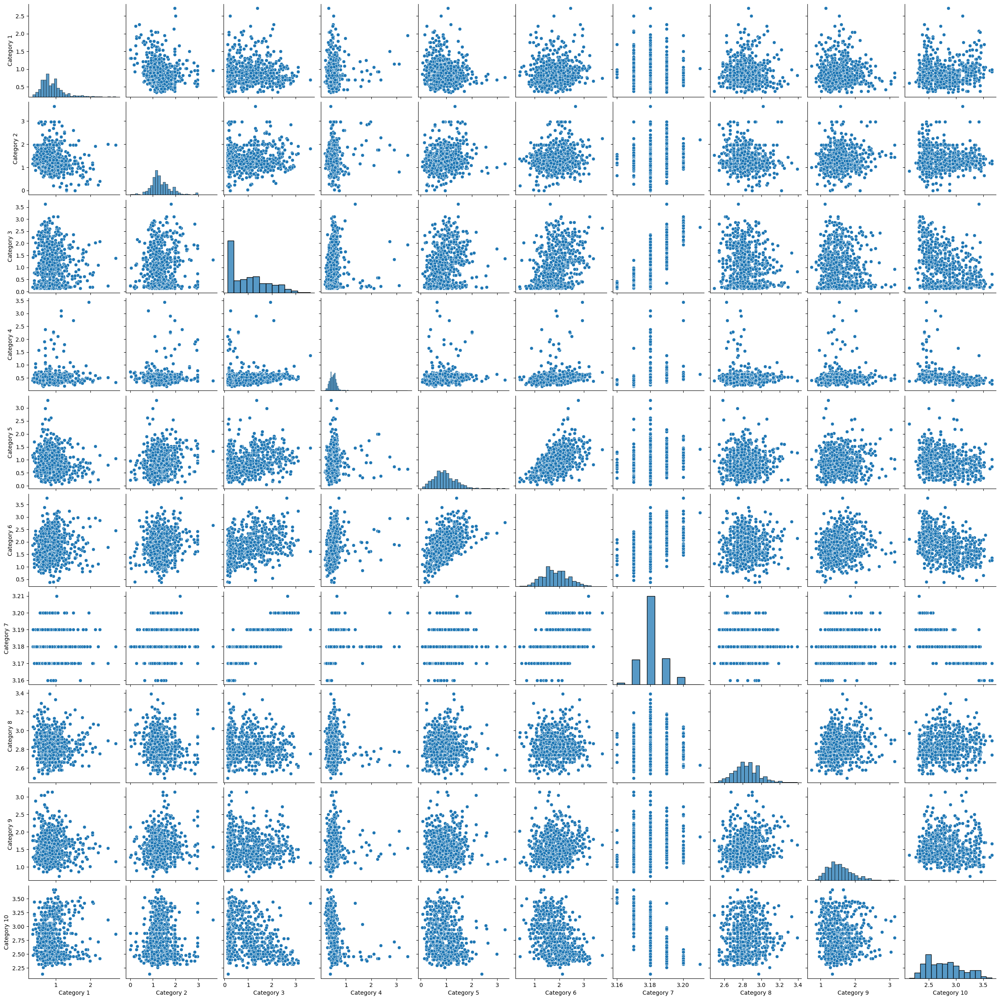

In [18]:
import matplotlib.pyplot  as plt 
import seaborn as sns

sns.pairplot(X)
plt.show()

## finding Optimal Number Of Cluster Using Elbow Method

In [110]:
from sklearn.cluster import KMeans
sse=[]
ranges=[i for i in range(1,12)]
for i in ranges:
    mdl=KMeans(n_clusters=i,n_init="auto",random_state=42)
    mdl.fit(X)
    sse.append(mdl.inertia_)
sse

[1334.7789804081626,
 904.4653391467832,
 801.8881210914258,
 744.5055177655488,
 686.6301738379545,
 662.0318228113119,
 602.9233322813642,
 593.0311889399753,
 565.7059746154367,
 524.4726002918817,
 507.0019969259374]

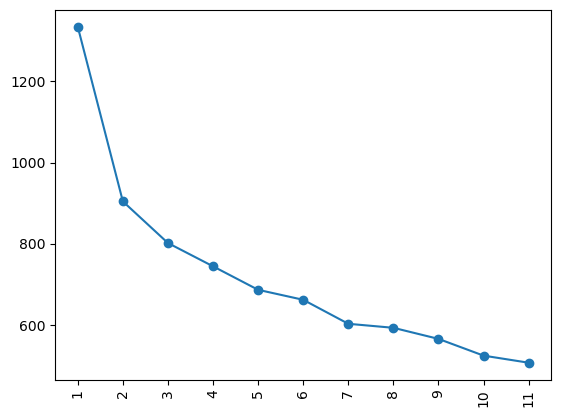

In [111]:
plt.plot(ranges,sse,marker="o")
plt.xticks(ranges,rotation=90)
plt.show()

In [112]:
from sklearn.metrics import silhouette_score
model_kmeans=KMeans(n_clusters=4,n_init="auto",random_state=42)
model_kmeans.fit(X)
labels=model_kmeans.labels_
silhouette_score(X,labels)

0.17009279856073337

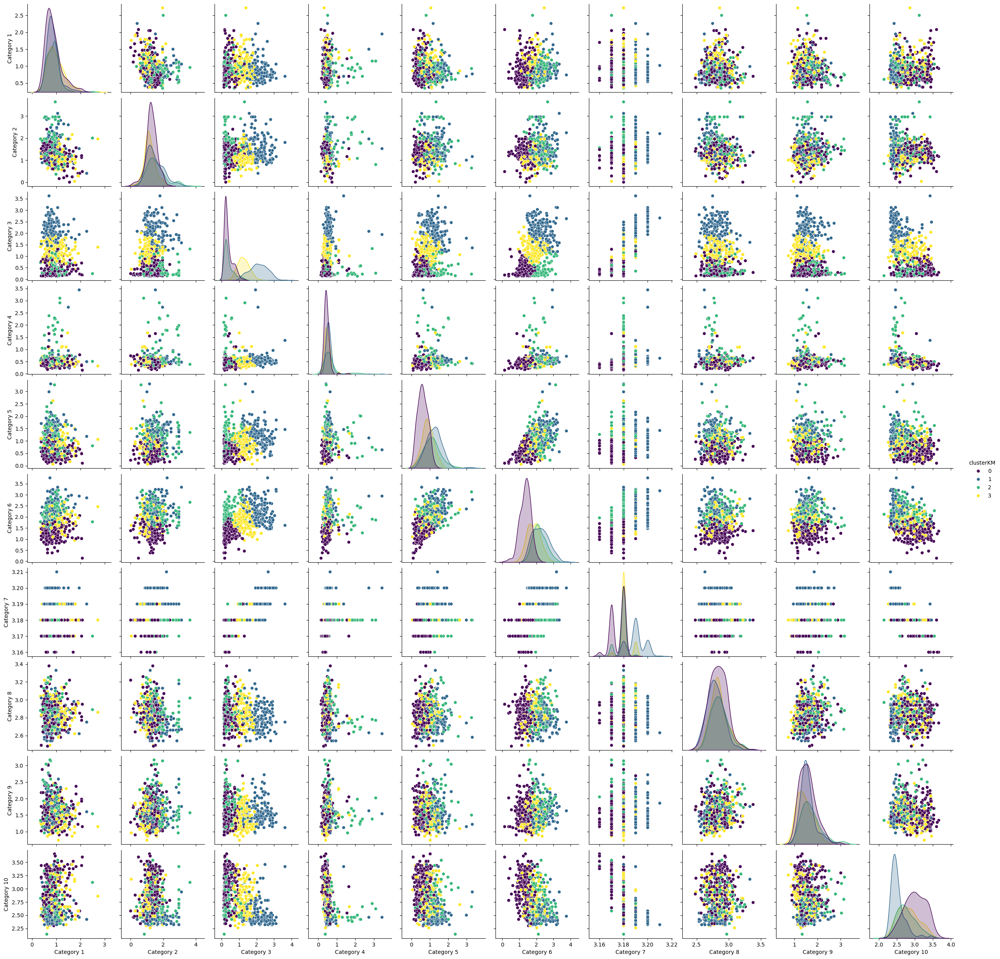

In [114]:
X["clusterKM"]=labels
sns.pairplot(X,hue="clusterKM",palette="viridis")
plt.show()

In [80]:
from sklearn.cluster import AgglomerativeClustering
model_aggl=AgglomerativeClustering(n_clusters=4,linkage="ward")
model_aggl.fit(X.drop("clusterKM",axis=1))
labels_aggl=model_aggl.labels_
silhouette_score(X,labels_aggl)

0.12745509803317967

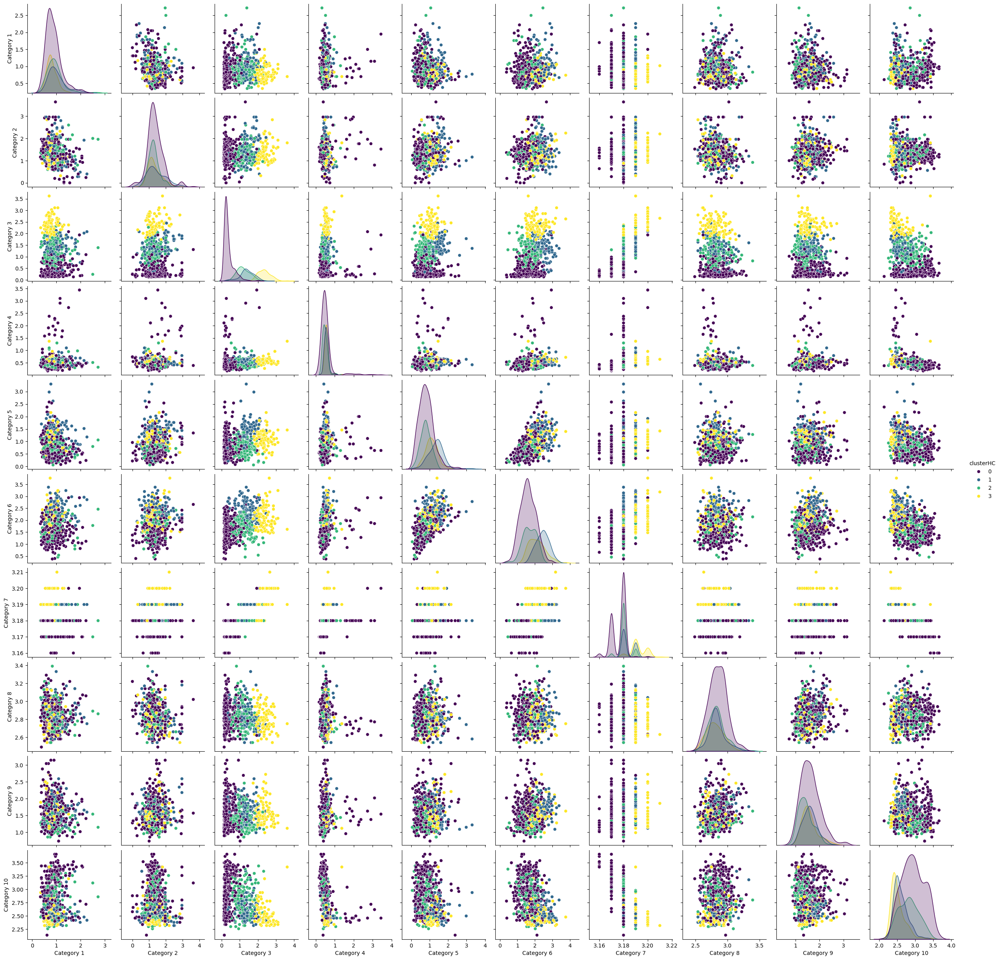

In [105]:
X["clusterHC"]=labels_aggl
sns.pairplot(X.drop("clusterKM",axis=1),hue="clusterHC",palette="viridis")
plt.show()

In [90]:
from sklearn.cluster import DBSCAN
model_db=DBSCAN(eps=1,min_samples=10)
model_db.fit(X)
labels_db=model_db.labels_
silhouette_score(X,labels_db)



0.3837095314593671

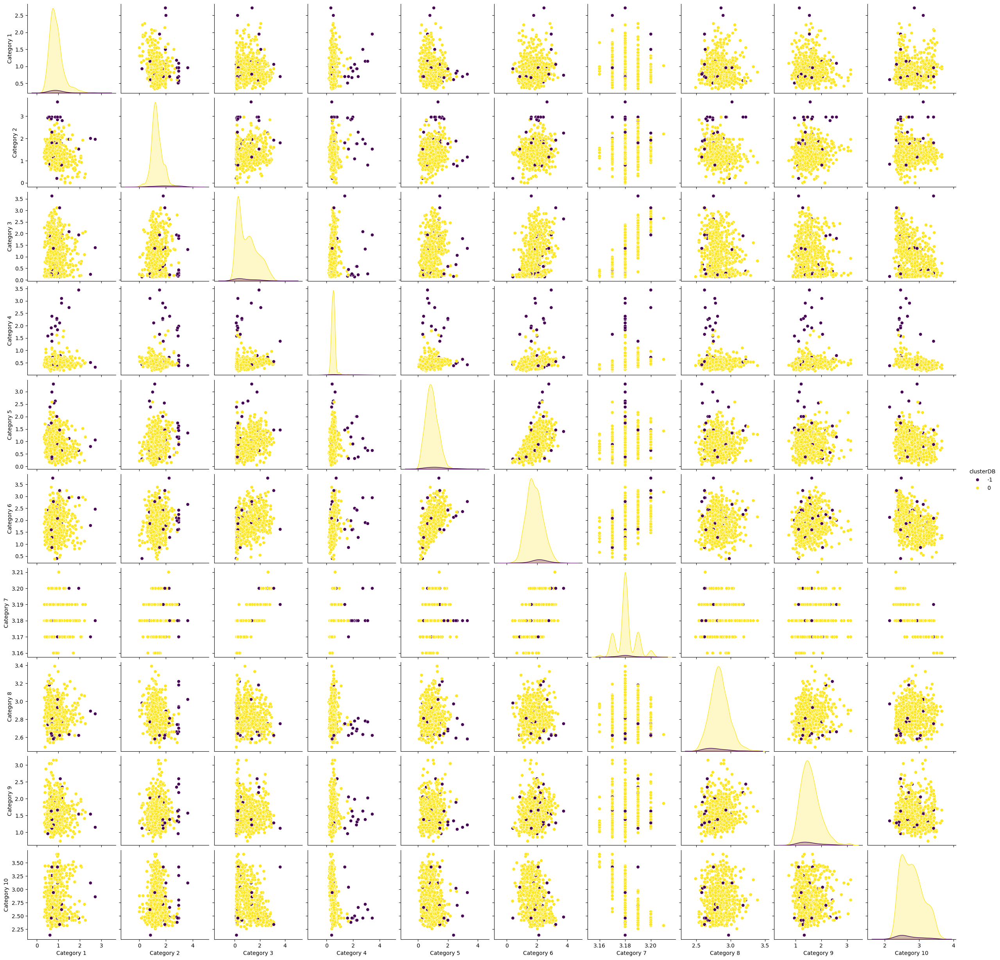

In [86]:
X["clusterDB"]=labels_db
sns.pairplot(X.drop(["clusterKM","clusterHC"],axis=1),hue="clusterDB",palette="viridis")

In [84]:
labels_db

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0, -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1

In [98]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
y=X.clusterDB
X_train,X_test,y_train,y_test=train_test_split(X.drop("clusterDB",axis=1),y,test_size=0.25,random_state=42)
modelR=LogisticRegression()
modelR.fit(X_train,y_train)

LogisticRegression()

In [100]:
from sklearn.metrics import classification_report
y_pred=modelR.predict(X_test)
score=classification_report(y_test,y_pred)
print(score)

              precision    recall  f1-score   support

          -1       0.67      0.25      0.36         8
           0       0.97      0.99      0.98       176

    accuracy                           0.96       184
   macro avg       0.82      0.62      0.67       184
weighted avg       0.95      0.96      0.95       184



In [102]:
y.value_counts()

clusterDB
 0    703
-1     32
Name: count, dtype: int64